In [1]:
import numpy as np
import os
import soundfile as sf
from sklearn.manifold import Isomap
import matplotlib.pyplot as plt
import sys
import tensorflow as tf
sys.path.append("../src")
sys.path.append("/home/han/kymatio-jtfs/")
sys.path.append("../scripts")

import train
import features
import data_generator
import cnn
import ftm_ver2

import pandas as pd
import librosa
import IPython.display as ipd
from kymatio.torch import TimeFrequencyScattering1D,Scattering1D
import torch
from kymatio.scattering1d.core import timefrequency_scattering1d as tf_scat
from sklearn.neighbors import NearestNeighbors
import pescador
from tqdm import tqdm
import tensorflow.keras.backend as K

In [2]:
feat_path = "/home/han/data/drum_data/han2022features-pkl/jtfs_j14_q16/"
model_path = "/home/han/wave2shape/output/doce"
audio_path = "/home/han/data/drum_data/"

In [3]:
def find_best_trial(exp):
    min_vals = []
    for trial in os.listdir(exp):
        if os.path.isdir(os.path.join(exp,trial)):
            loss = pd.read_csv(os.path.join(exp,trial,"training.log"))
            min_vals.append(min(loss["val_loss"]))
    min_min = min(min_vals)
    return os.listdir(exp)[min_vals.index(min_min)]


def yield_prediction(feat_test,ckpt_path,model,is_generator):
    model.load_weights(ckpt_path)
    if is_generator:
        feat_test = pescador.tuples(feat_test,'input','y')
    preds = model.predict(feat_test,verbose=1)
    return preds

def make_model_predict(ftype,J,Q,y_test_normalized,loss,param,is_generator,feat_test=None):
    N = 2**16
    sr = 22050
    logscale = 0.001
    exp_type="_".join(["multitask"+str(True), loss, param, "linear", "log"+str(logscale)])
    exp_name = "_".join([ftype,"J"+str(J),"Q"+str(Q),"bs"+str(64),exp_type])
    trial_name = find_best_trial(os.path.join(model_path,exp_name))
    print(exp_name,trial_name)
    #figure out feature dimension
    waveform = np.zeros((N,))
    ex_input = features.make_cqt(waveform,Q,sr,J,fmin=32.7)
    ex_input = ex_input[:,:,None]
    #make model
    K.clear_session()
    model = cnn.create_model_conv2d(bins_per_oct=Q,S=ex_input[None,:],activation="linear",is_multitask=True,lr=0.01)
    print(model.summary())
    ckpt_path = os.path.join(model_path,exp_name,trial_name,"ckpt")
    #make test set data generator
    test_idx = np.arange(0,y_test_normalized.shape[0],1)
    #normalize test set ground truth
    if is_generator:
        feature_type = {"type":"cqt","J":J,"Q":Q}
        test_batches = data_generator.data_generator(test_ids,
                                               "test",
                                            y_test_normalized, 
                                            feature_type,
                                            audio_path,
                                            batch_size=64, 
                                            idx=test_idx,
                                            active_streamers=32,
                                            rate=64,
                                            random_state=44000,
                                            loss=loss,
                                             param=param,
                                            eps=logscale)
    else:
        test_batches = feat_test
    #load weights to model and yield prediction
    preds = yield_prediction(test_batches,ckpt_path,model,is_generator)
    del model
    del feat_test
    tf.keras.backend.clear_session()
    return preds

    

1.5485444068908691 0.029083047062158585


2022-07-18 20:38:29.374844: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:936] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2022-07-18 20:38:29.375509: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:936] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2022-07-18 20:38:29.382600: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:936] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2022-07-18 20:38:29.383291: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:936] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2022-07-18 20:38:29.383915: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:936] successful NUMA node read from S

Text(0.5, 1.0, 'Absolute Error between reconstructed and original physical parameters')

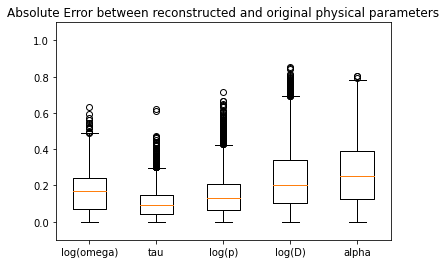

In [4]:
y_pred,y_gt = np.load(os.path.join(model_path,
                                     "cqt_J8_Q16_bs64_multitaskTrue_ploss_alpha_linear_new_log0.001",
                                  "trial0","test_preds.npy"))
print(np.max(y_pred),np.min(y_pred))
mse_k = tf.keras.losses.MeanSquaredError()
mse_k(y_gt,y_pred)
plt.rcParams['text.usetex'] = False
labels = ['log(omega)','tau','log(p)','log(D)',"alpha"]
plt.boxplot(np.abs(y_pred-y_gt),labels = labels)
plt.ylim([-0.1,1.1])
plt.title('Absolute Error between reconstructed and original physical parameters')

1.7839887142181396 0.06283244490623474


Text(0.5, 1.0, 'Absolute Error between reconstructed and original physical parameters')

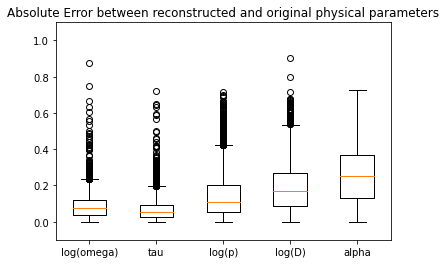

In [11]:
y_pred,y_gt = np.load(os.path.join(model_path,
                                     "cqt_J8_Q16_bs64_multitaskTrue_ploss_alpha_linear_summse_log0.001",
                                  "trial0","test_preds.npy"))
print(np.max(y_pred),np.min(y_pred))
mse_k = tf.keras.losses.MeanSquaredError()
mse_k(y_gt,y_pred)
plt.rcParams['text.usetex'] = False
labels = ['log(omega)','tau','log(p)','log(D)',"alpha"]
plt.boxplot(np.abs(y_pred-y_gt),labels = labels)
plt.ylim([-0.1,1.1])
plt.title('Absolute Error between reconstructed and original physical parameters')

test scattering model's output

In [16]:
ftype = "scattering_o2"
logscale = 1e-3
J = 12
Q = 16
exp_type="_".join(["multitask"+str(True), "linear", "log"+str(logscale)])
exp_name = "_".join([ftype,"J"+str(J),"Q"+str(Q),"bs"+str(64),exp_type])

trial_name = find_best_trial(os.path.join(model_path,exp_name))
print(exp_name,trial_name)
#load features
feat_path = os.path.join("/home/han/data/drum_data/han2022features-pkl/",ftype,
                         ftype+"_fold-val"+"_J-"+str(J)+"_Q-"+str(Q))
num = 0
scat_feat = []
scat_gt = []
gt_idx = []

if Q == 16:
    for f in os.listdir(feat_path):
        idx = int(f.split("_")[0])
        gt_idx.append(idx)
        Sy,y = np.load(os.path.join(feat_path,f),allow_pickle=True)
        scat_feat.append(Sy)
        scat_gt.append(y)
        num += 1
        if num > 500:
            break
    scat_feat = np.stack(scat_feat)
    scat_gt = np.stack(scat_gt) #(501, 32, 1053), (501, 5)
else:
    feat_path = feat_path + ".pkl"
    Sy,y = np.load(feat_path, allow_pickle=True)
    print(feat_path)


scat_feat_log = np.log1p(scat_feat/logscale)

scattering_o2_J12_Q16_bs64_multitaskTrue_linear_log0.001 trial3


In [17]:
K.clear_session()
model = cnn.create_model_conv1d(J, Q, scat_feat_log, activation="linear",is_multitask=True,lr=0.01)
#exp_name = "scattering_o2_J8_Q16_bs64_multitaskTrue_ploss_alpha_linear_log0.001"
#trial_name = "trial0"
ckpt_path = os.path.join(model_path,exp_name,trial_name,"ckpt")
model.load_weights(ckpt_path)
y_preds = model.predict(scat_feat,verbose=1)

2022-06-23 17:27:20.213039: I tensorflow/stream_executor/cuda/cuda_dnn.cc:368] Loaded cuDNN version 8101
2022-06-23 17:27:20.837952: I tensorflow/core/platform/default/subprocess.cc:304] Start cannot spawn child process: No such file or directory
2022-06-23 17:27:20.838435: I tensorflow/core/platform/default/subprocess.cc:304] Start cannot spawn child process: No such file or directory
2022-06-23 17:27:20.838476: W tensorflow/stream_executor/gpu/asm_compiler.cc:80] Couldn't get ptxas version string: INTERNAL: Couldn't invoke ptxas --version
2022-06-23 17:27:20.861189: I tensorflow/core/platform/default/subprocess.cc:304] Start cannot spawn child process: No such file or directory
2022-06-23 17:27:20.861329: W tensorflow/stream_executor/gpu/redzone_allocator.cc:314] INTERNAL: Failed to launch ptxas
Relying on driver to perform ptx compilation. 
Modify $PATH to customize ptxas location.
This message will be only logged once.


16/16 [==============================] - 3s 27ms/step


In [5]:
#make all test set features cqt, J=8,Q=16, and save them
J = 8
Q = 16
sr = 22050
csv_path = os.path.join(audio_path,"annotations", "test_param_v2.csv")
df = pd.read_csv(csv_path)
sample_ids = df.values[:, 0]
feat_cqt = []
fmin = 0.4*sr/np.power(2,J)
for i in tqdm(sample_ids):
    wav_path = os.path.join(audio_path,"test", str(i)+"_sound.wav")
    waveform, sr = sf.read(wav_path)
    feat_cqt.append(features.make_cqt(waveform,Q,sr,J,fmin=fmin))
feat_cqt = np.stack(feat_cqt)

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 10000/10000 [14:40<00:00, 11.35it/s]


In [7]:
np.save(os.path.join("/home/han/data/drum_data/han2022features-pkl/","CQT_J8_Q16_testset_features.npy"),feat_cqt)

## Metrics 
goal: scripts that compare various models' performance on regression task, given the same test set and its nearest neighbor graph computed on its JTFS J=14, Q=16 features.

0. regression error per parameter
1. precision at K
2. average ranking
3. mean geodesic distance

0. regression error per parameter

In [4]:
#hyper parameters
param = "alpha" #or beta_alpha
ftype = "cqt"
J = 8
Q = 16
loss = "ploss" # or ploss
is_multitask = True
activation = "linear"
logscale = 0.001
batch_size = 64


N = 2**16
sr = 22050

In [5]:
#load test set ground truth
y_test,test_ids = train.load_gt("test", param)
y_train,train_ids = train.load_gt("train", param)
y_val,val_ids = train.load_gt("val", param)

In [6]:
import copy
y_train_normalized,y_val_normalized,y_test_normalized,scaler = train.preprocess_gt(copy.deepcopy(y_train),
                                                                            copy.deepcopy(y_val),
                                                                            copy.deepcopy(y_test),param) 


In [7]:
J = 8
y_preds = {"ploss":{},"weighted_p":{}}
for loss in ["ploss","weighted_p"]:
    for param in ["alpha", "beta_alpha"]:
        exp_type="_".join(["multitask"+str(True), loss, param, "linear", "log"+str(logscale)])
        exp_name = "_".join([ftype,"J"+str(J),"Q"+str(Q),"bs"+str(64),exp_type])
        trial_name = find_best_trial(os.path.join(model_path,exp_name))
        print(exp_name,trial_name)
        #y_preds[loss][param] = np.load(os.path.join(model_path,exp_name,trial_name)+"_test_preds.npy")
        y_preds[loss][param],y_gt = np.load(os.path.join(model_path,exp_name,trial_name,"test_preds.npy"))
        

cqt_J8_Q16_bs64_multitaskTrue_ploss_alpha_linear_log0.001 trial2
cqt_J8_Q16_bs64_multitaskTrue_ploss_beta_alpha_linear_log0.001 trial0
cqt_J8_Q16_bs64_multitaskTrue_weighted_p_alpha_linear_log0.001 trial2
cqt_J8_Q16_bs64_multitaskTrue_weighted_p_beta_alpha_linear_log0.001 trial2


<Figure size 432x288 with 0 Axes>

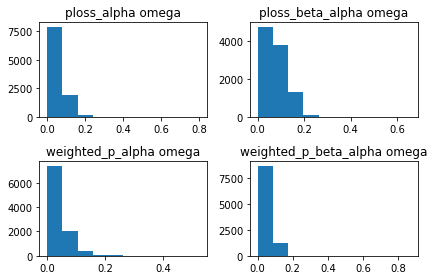

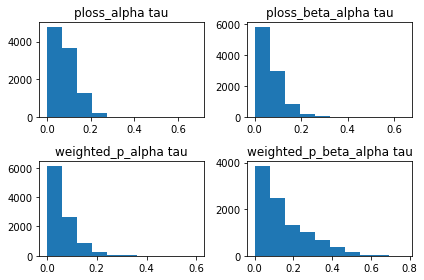

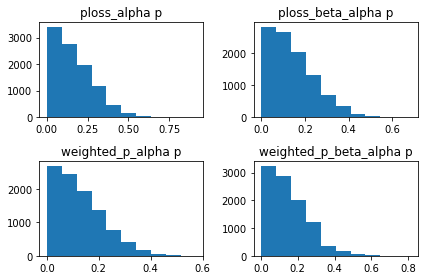

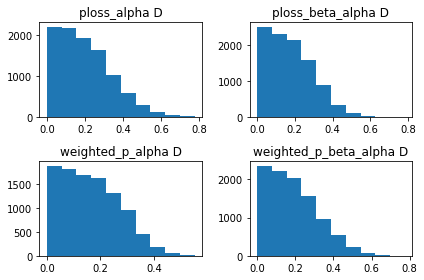

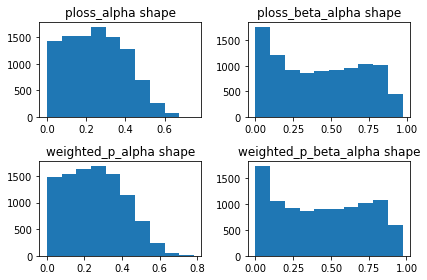

In [16]:
params = ["omega","tau","p","D","shape"]
for i in range(5):
    plt.figure(i+1)
    plt.subplots(2,2)
    num = 1
    for loss in ["ploss","weighted_p"]:
        for param in ["alpha", "beta_alpha"]:
            plt.subplot(2,2,num)
            plt.hist(np.abs(y_preds[loss][param][:,i]-y_test_normalized[:,i]))
            plt.title(loss+"_"+param+" "+ params[i])
            num += 1
            plt.tight_layout()

1.7218118906021118 0.09531885385513306 ploss alpha
1.065079927444458 0.09531885385513306
1.2740695476531982 0.10548882931470871
1.4941251277923584 0.2035134881734848
1.7218118906021118 0.24814864993095398
0.8399945497512817 0.1734127700328827
1.4235007762908936 0.01758500188589096 ploss beta_alpha
1.3048152923583984 0.08730296790599823
1.211155652999878 0.08011604845523834
1.3813574314117432 0.11412014067173004
1.4235007762908936 0.15346145629882812
0.2599335014820099 0.01758500188589096
1.2416497468948364 0.06780360639095306 weighted_p alpha
1.0789339542388916 0.09730206429958344
1.067129135131836 0.06780360639095306
1.2416497468948364 0.11752277612686157
1.2384377717971802 0.20186108350753784
0.8527527451515198 0.19286701083183289
1.7440577745437622 0.01219919417053461 weighted_p beta_alpha
1.0554468631744385 0.10001926869153976
1.7423756122589111 0.06622999161481857
1.607643961906433 0.17461618781089783
1.7440577745437622 0.12425824999809265
0.18614432215690613 0.01219919417053461


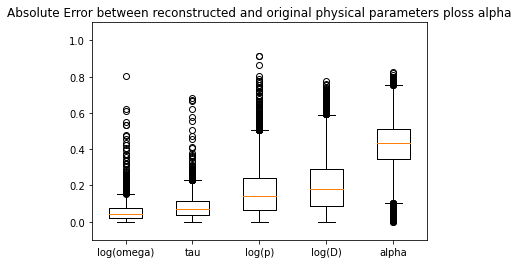

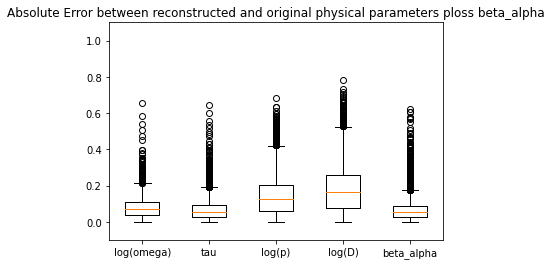

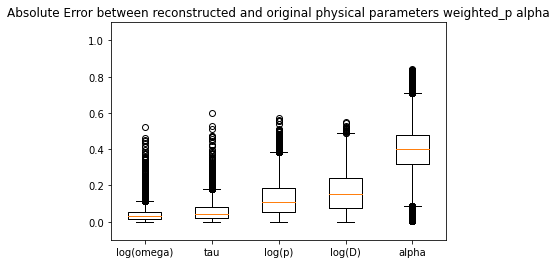

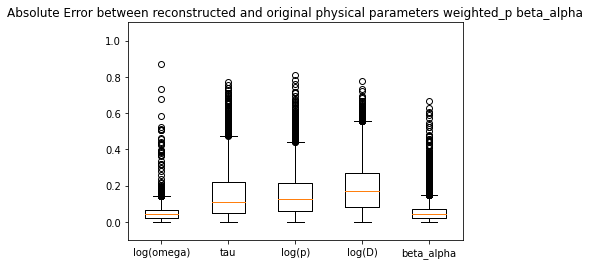

In [7]:
num = 1
for loss in ["ploss","weighted_p"]:
    for param in ["alpha", "beta_alpha"]:
        y_pred = y_preds[loss][param]
        print(np.max(y_pred),np.min(y_pred),loss,param)
        for i in range(5):
            print(np.max(y_pred[:,i]),np.min(y_pred[:,i]))
        plt.figure(num)
        plt.rcParams['text.usetex'] = False
        labels = ['log(omega)','tau','log(p)','log(D)',param]
        plt.boxplot(np.abs(y_pred-y_gt),labels = labels)
        plt.title('Absolute Error between reconstructed and original physical parameters '+ loss + " " + param)
        plt.ylim([-0.1,1.1])
        num += 1

1. precision at K:

    construct nn of test set jtfs, query if reconstructed prediction's jtfs falls into k neighborhood of groundtruth jtfs.

In [11]:
import running_var

In [14]:
def load_jtfs(fold_str, idx_reduced):
    csv_path = "../notebooks/" + fold_str + "_param_v2.csv"
    df = pd.read_csv(csv_path)
    sample_ids = df.values[:, 0]
    y = df.values[:,1:-1]
    ba = 1/y[:,-1] + 1/y[:,-1]**2
    y_ba = np.hstack((y, ba[:,None]))
    
    jtfs_set = []
    num = 0
    for i in sample_ids:
        wav_path = os.path.join(feature_path,"jtfs_j"+str(J)+"_q"+str(Q),fold_str,
                                       fold_str+"_"+str(i)+".npy")
        if os.path.exists(wav_path):
            jtfs_wav = np.load(wav_path)
            jtfs_set.append(jtfs_wav.squeeze()[idx_reduced])
            num += 1
        #if num % 100 == 0:
        #    print(num)
    jtfs_set = np.stack(jtfs_set)
    jtfs_set = np.maximum(0,jtfs_set.squeeze())
    #jtfs_set = np.maximum(0,jtfs_set.reshape((jtfs_set.shape[0],
    #                        jtfs_set.shape[1]*jtfs_set.shape[2]*jtfs_set.shape[3])))
    
    #mulogscale jtfs
    eps = 0.1
    mu = np.mean(jtfs_set,axis=0)
    jtfs_set = np.log1p(jtfs_set/eps/mu[None,:])
    
    return jtfs_set,y_ba, mu


In [40]:
#compute nearest neighbor graph of jtfs features of the entire test set
fold = "test"
feature_path = "/home/han/data/drum_data/han2022features-pkl/"
J = 14
Q = 16
k = 300 # reduced dimensionality
n_nbr = 10 #5%

mean_fold, var_fold, sampvar_fold = running_var.welford(os.path.join(feature_path,
                                                                     "jtfs_j"+str(J)+"_q"+str(Q),
                                                                     fold))
print("finished running variance computation " + fold)
idx_fold = np.flip(np.argsort(sampvar_fold))[:k]
reduced_fold_jtfs, y_fold, mu_fold = load_jtfs(fold,idx_fold)
print("finished loading features with reduced dimensionality " + fold)
# reduced_fold_jtfs = fold_jtfs[:,idx_fold]
#print("finished reducing dimensionality " + fold)
nbrs_fold = NearestNeighbors(n_neighbors=n_nbr, algorithm='ball_tree').fit(reduced_fold_jtfs)
distances_fold, indices_fold = nbrs_fold.kneighbors(reduced_fold_jtfs) # only n_nbr neighbors can be extracted
print("finished building nearest neighbor graph " + fold)

finished running variance computation test
finished loading features with reduced dimensionality test
finished building nearest neighbor graph test


In [39]:
distances_fold.shape,reduced_fold_jtfs.shape

((10000, 10), (10000, 300))

In [28]:
isomap_fold = Isomap(n_neighbors=n_nbr).fit(reduced_fold_jtfs)

In [29]:
def inverse_scale(y_predicted,scaler,param):
    if param == "beta_alpha":
        param_idx = [0,2,3,4]
    else:
        param_idx = [0,2,3]
    y_predicted_o = scaler.inverse_transform(y_predicted)
    #inverse logscale
    for idx in param_idx:
        y_predicted_o[:,idx] = [pow(10,i) for i in y_predicted_o[:,idx]]
    return y_predicted_o

In [30]:
jtfs = TimeFrequencyScattering1D(
                J = 14, #scale
                shape = (2**16, ), 
                Q = 16, #filters per octave, frequency resolution
                T = 2**16, 
                max_pad_factor=1,
                max_pad_factor_fr=1,
                average = True,
                average_fr = False,
            ).cuda()


In [19]:
def find_rank(a,b):
    n = len(a)
    if n == 1:
        return a[0] #rank of a 
    else:
        if b > a[n//2]:
            return find_rank(a[n//2:],b)
        else:
            return find_rank(a[:n//2],b)
        

In [31]:
param = "alpha"
y_test,test_ids = train.load_gt("test", param)
y_train,train_ids = train.load_gt("train", param)
y_val,val_ids = train.load_gt("val", param)
y_train_normalized,y_val_normalized,y_test_normalized,scaler = train.preprocess_gt(y_train,y_val,y_test,param) 


In [32]:
def mean_recipro_rank(ranks): #closer to 1 the higher ranking
    N = len(ranks)
    return 1/N*np.sum(1/np.array(ranks))

In [33]:
csv_path = os.path.join(audio_path,"annotations", "test_param_v2.csv")
df = pd.read_csv(csv_path)
sample_ids = df.values[:, 0]

In [34]:
from sklearn.metrics import DistanceMetric
min_dist = DistanceMetric.get_metric('minkowski')
mindist = min_dist.pairwise(jtfs_wav_red.reshape(1,-1),reduced_fold_jtfs[i,:].reshape(1,-1))
dist = np.linalg.norm(jtfs_wav_red - reduced_fold_jtfs[i,:],ord=2)
print(mindist,dist)

ValueError: X and Y must have the same second dimension

In [41]:
#resynthesize sound from prediction
eps = 0.1
k = 10
y_predicted = y_preds["ploss"]["beta_alpha"]
#scale prediction back to original range
y_predicted_o = inverse_scale(y_predicted,scaler,param="beta_alpha")
ranks = []
geo_dist = []
min_dist = DistanceMetric.get_metric('minkowski')
for i in range(y_predicted_o.shape[0]):
    #synthesize audio
    omega,tau,p,D,ba = y_predicted_o[i,:]
    root = max(np.roots([ba,-1,-1]))
    alpha = min(root,1/root) # could be a problem when alpha too small
    print(alpha,ba)
    wavform = ftm_ver2.getsounds_dif_linear_nonorm(10,10,0.5,0.5,0.03,tau,
                                        omega,p,D,np.pi,
                                        alpha,sr)
    wavform = wavform / max(wavform)
    #compute jtfs
    display(ipd.Audio(wavform,rate=sr)) #predicted waveform
    
    wav_o,_ = sf.read(os.path.join(audio_path,"test",str(sample_ids[i])+"_sound.wav"))
    display(ipd.Audio(wav_o,rate=sr)) #ground truth waveform
    
    jtfs_wav = jtfs(np.array(wavform))/np.linalg.norm(wavform,ord=2)
    #apply dimensionality reduction
    jtfs_wav_red = jtfs_wav.squeeze()[list(idx_fold)]
    jtfs_wav_red = np.maximum(0,jtfs_wav_red.cpu().squeeze())
     #mulog
    jtfs_wav_red = np.log1p(jtfs_wav_red/eps/mu_fold)
                
    #print(max(jtfs_wav_red),min(jtfs_wav_red),max(reduced_fold_jtfs[i,:]),min(reduced_fold_jtfs[i,:]))
    #print("is prediction changing",np.sum(np.array(jtfs_wav_red.cpu())),np.sum(reduced_fold_jtfs[i,:]))
    #measure euclidean distance to reference and compare with nth neighbor distance
    dist = np.linalg.norm(jtfs_wav_red - reduced_fold_jtfs[i,:],ord=2)
    mindist = min_dist.pairwise(jtfs_wav_red.reshape(1,-1),reduced_fold_jtfs[i,:].reshape(1,-1))
    print("distance",k,distances_fold[i,k-1],dist,mindist) #PRECISION AT K: kth neighbor distance vs. current distance 
    
    closest_nbr = find_rank(distances_fold[i,:],dist) #distance of the closest nbr
    rank = list(distances_fold[i,:]).index(closest_nbr)
    nbr_idx = indices_fold[i,rank]
    
    wav_nbr,_ = sf.read(os.path.join(audio_path,"test",str(sample_ids[nbr_idx])+"_sound.wav"))
    display(ipd.Audio(wav_nbr,rate=sr)) # 50th neighbor waveform
    
    ranks.append(rank) # AVEREAGE RANKING
    print("closest neighbor's rank, position in the test set",rank,nbr_idx)
    #compute euclidean distance to the chosen neighbor (have to query this closest neighbor some other ways)
    dist2nbr,clonbr_idx = nbrs_fold.kneighbors(jtfs_wav_red.cpu().reshape(1,-1),n_neighbors=1)
    print("why same nbr",clonbr_idx)
    dist_nbrgeo = isomap_fold.dist_matrix_[i,clonbr_idx]#chosen neighbor's geodesic distance
    dist_geo = dist_nbrgeo + dist2nbr
    geo_dist.append(dist_geo)
    print("this neighbor's geodesic dist to reference, prediction's distance to this neighbor",clonbr_idx,
          dist_geo,dist2nbr)
    if i>10:
        break
avg_rank = mean_recipro_rank(ranks)


0.6649531214162433 1.1071157750974487


distance 10 1.40776358746593 23.084868256165933 [[23.08486826]]


closest neighbor's rank, position in the test set 9 2916
why same nbr [[5728]]
this neighbor's geodesic dist to reference, prediction's distance to this neighbor [[5728]] [[38.23462639]] [[7.11549444]]
0.6687324532587854 1.1159355473002988


distance 10 3.6263448109959615 16.586706711671567 [[16.58670671]]


closest neighbor's rank, position in the test set 9 5447
why same nbr [[9396]]
this neighbor's geodesic dist to reference, prediction's distance to this neighbor [[9396]] [[58.50288449]] [[15.35278263]]
0.6840749283341474 1.1520334359095161


distance 10 1.8205200547885965 17.242144334159537 [[17.24214433]]


closest neighbor's rank, position in the test set 9 9501
why same nbr [[7163]]
this neighbor's geodesic dist to reference, prediction's distance to this neighbor [[7163]] [[39.67350615]] [[6.7046951]]
0.697752062064855 1.184610002180612


distance 10 6.036062539145767 13.277641675256742 [[13.27764168]]


closest neighbor's rank, position in the test set 9 4707
why same nbr [[5553]]
this neighbor's geodesic dist to reference, prediction's distance to this neighbor [[5553]] [[45.06530727]] [[12.66997294]]
0.8476780128812889 1.5662360264036597


distance 10 5.738854292337033 16.80333693026584 [[16.80333693]]


closest neighbor's rank, position in the test set 9 9874
why same nbr [[2987]]
this neighbor's geodesic dist to reference, prediction's distance to this neighbor [[2987]] [[48.46261641]] [[13.4962207]]
0.6732961661089564 1.1266238934059758


distance 10 6.92306081094495 21.558091064313608 [[21.55809106]]


closest neighbor's rank, position in the test set 9 6369
why same nbr [[5728]]
this neighbor's geodesic dist to reference, prediction's distance to this neighbor [[5728]] [[40.02033429]] [[10.71654042]]
0.6876013869693618 1.1603970543315516


distance 10 2.919469115301572 17.709886803164537 [[17.7098868]]


closest neighbor's rank, position in the test set 9 8890
why same nbr [[4938]]
this neighbor's geodesic dist to reference, prediction's distance to this neighbor [[4938]] [[58.81617922]] [[16.16004888]]
0.8134073329011083 1.4750388221184028


distance 10 4.760504376429924 29.117562136727134 [[29.11756214]]


closest neighbor's rank, position in the test set 9 3200
why same nbr [[3277]]
this neighbor's geodesic dist to reference, prediction's distance to this neighbor [[3277]] [[80.50680328]] [[12.54348356]]
0.790146202828595 1.4144772246730424


distance 10 11.087928306324017 27.211820124432304 [[27.21182012]]


closest neighbor's rank, position in the test set 9 7349
why same nbr [[2797]]
this neighbor's geodesic dist to reference, prediction's distance to this neighbor [[2797]] [[77.59227184]] [[4.71265755]]
0.6841221139186981 1.1521451806712864


distance 10 2.720296174174134 17.387231233322115 [[17.38723123]]


closest neighbor's rank, position in the test set 9 7618
why same nbr [[3726]]
this neighbor's geodesic dist to reference, prediction's distance to this neighbor [[3726]] [[48.61137378]] [[5.90877981]]
0.6911923802027038 1.1689392866529826


distance 10 2.647503354934558 26.81899494229479 [[26.81899494]]


closest neighbor's rank, position in the test set 9 1637
why same nbr [[7942]]
this neighbor's geodesic dist to reference, prediction's distance to this neighbor [[7942]] [[77.82673663]] [[15.86656501]]
0.8558619606524254 1.588361656344239


distance 10 5.309211636749021 27.071349753022638 [[27.07134975]]


closest neighbor's rank, position in the test set 9 4930
why same nbr [[1201]]
this neighbor's geodesic dist to reference, prediction's distance to this neighbor [[1201]] [[72.62012801]] [[12.32150437]]


In [57]:
#resynthesize sound from prediction
y_predicted = y_preds["weighted_p"]["beta_alpha"]
#scale prediction back to original range
y_predicted_o = inverse_scale(y_predicted,scaler,param="beta_alpha")
ranks = []
geo_dist = []
for i in range(y_predicted_o.shape[0]):
    #synthesize audio
    omega,tau,p,D,ba = y_predicted_o[i,:]
    root = max(np.roots([ba,-1,-1]))
    alpha = min(root,1/root) # could be a problem when alpha too small
    print(alpha,ba)
    wavform = ftm_ver2.getsounds_dif_linear_nonorm(10,10,0.5,0.5,0.03,tau,
                                        omega,p,D,np.pi,
                                        alpha,sr)
    wavform = wavform / max(wavform)
    #compute jtfs
    display(ipd.Audio(wavform,rate=sr)) #predicted waveform
    
    wav_o,_ = sf.read(os.path.join(audio_path,"test",str(sample_ids[i])+"_sound.wav"))
    display(ipd.Audio(wav_o,rate=sr)) #ground truth waveform
    
    jtfs_wav = jtafs(np.array(wavform))/np.linalg.norm(wavform,ord=2)
    #apply dimensionality reduction
    jtfs_wav_red = jtfs_wav.squeeze()[list(idx_fold)]
    jtfs_wav_red = np.maximum(0,jtfs_wav_red.cpu().squeeze())
    #print(max(jtfs_wav_red),min(jtfs_wav_red),max(reduced_fold_jtfs[i,:]),min(reduced_fold_jtfs[i,:]))
    #print("is prediction changing",np.sum(np.array(jtfs_wav_red.cpu())),np.sum(reduced_fold_jtfs[i,:]))
    #measure euclidean distance to reference and compare with nth neighbor distance
    dist = np.linalg.norm(jtfs_wav_red - reduced_fold_jtfs[i,:],ord=2)
    print("distance",k,distances_fold[i,k-1],dist) #PRECISION AT K: kth neighbor distance vs. current distance 
    
    closest_nbr = find_rank(distances_fold[i,:],dist) #distance of the closest nbr
    rank = list(distances_fold[i,:]).index(closest_nbr)
    nbr_idx = indices_fold[i,rank]
    
    wav_nbr,_ = sf.read(os.path.join(audio_path,"test",str(sample_ids[nbr_idx])+"_sound.wav"))
    display(ipd.Audio(wav_nbr,rate=sr)) # 50th neighbor waveform
    
    ranks.append(rank) # AVEREAGE RANKING
    print("closest neighbor's rank, position in the test set",rank,nbr_idx)
    #compute euclidean distance to the chosen neighbor (have to query this closest neighbor some other ways)
    dist2nbr,clonbr_idx = nbrs_fold.kneighbors(jtfs_wav_red.cpu().reshape(1,-1),n_neighbors=1)
    print("why same nbr",clonbr_idx)
    dist_nbrgeo = isomap_fold.dist_matrix_[i,clonbr_idx]#chosen neighbor's geodesic distance
    dist_geo = dist_nbrgeo + dist2nbr
    geo_dist.append(dist_geo)
    print("this neighbor's geodesic dist to reference, prediction's distance to this neighbor",clonbr_idx,
          dist_geo,dist2nbr)
    if i>10:
        break
avg_rank = mean_recipro_rank(ranks)


3.87564511843504 -4.44355338459334
0.698043589451682 1.1853084422262705


distance 50 0.10327696868844911 0.4429392924007217


closest neighbor's rank, position in the test set 79 1318
why same nbr [[7767]]
this neighbor's geodesic dist to reference, prediction's distance to this neighbor [[7767]] [[0.44545746]] [[0.00287288]]
0.6671812084066554 1.1123119732576205


distance 50 0.1671307012776473 0.8141932299603725


closest neighbor's rank, position in the test set 79 7240
why same nbr [[7502]]
this neighbor's geodesic dist to reference, prediction's distance to this neighbor [[7502]] [[1.25396743]] [[0.20376324]]
0.7062118454642311 1.204947016138226


distance 50 0.22103045313435962 0.7652545576789209


closest neighbor's rank, position in the test set 79 65
why same nbr [[8587]]
this neighbor's geodesic dist to reference, prediction's distance to this neighbor [[8587]] [[1.18411818]] [[0.08353843]]
0.6611129307604534 1.0981832379791296


distance 50 0.09283037620184197 0.10485200486624217


closest neighbor's rank, position in the test set 73 2258
why same nbr [[2529]]
this neighbor's geodesic dist to reference, prediction's distance to this neighbor [[2529]] [[0.16516843]] [[0.08710437]]
0.7139416619447696 1.2236543586052293


distance 50 0.06785553757072312 0.17630965182269212


closest neighbor's rank, position in the test set 79 4709
why same nbr [[8442]]
this neighbor's geodesic dist to reference, prediction's distance to this neighbor [[8442]] [[0.18161766]] [[0.00658821]]
0.7007334370806687 1.1917607869235562


distance 50 0.16076620243187228 0.57513454129014


closest neighbor's rank, position in the test set 79 1290
why same nbr [[3107]]
this neighbor's geodesic dist to reference, prediction's distance to this neighbor [[3107]] [[0.66582227]] [[0.01753001]]
0.6689559008882895 1.1164578982215523


distance 50 0.1788097509687255 0.6542537782486665


closest neighbor's rank, position in the test set 79 5851
why same nbr [[3950]]
this neighbor's geodesic dist to reference, prediction's distance to this neighbor [[3950]] [[0.97830635]] [[0.15055427]]
0.686483565619905 1.1577432514861237


distance 50 0.14172620333816555 0.7390689424996546


closest neighbor's rank, position in the test set 79 5119
why same nbr [[3582]]
this neighbor's geodesic dist to reference, prediction's distance to this neighbor [[3582]] [[1.00236185]] [[0.1003437]]
0.7328164786849853 1.2698364701172469


distance 50 0.1676135119597689 0.4196381000004972


closest neighbor's rank, position in the test set 79 5088
why same nbr [[2177]]
this neighbor's geodesic dist to reference, prediction's distance to this neighbor [[2177]] [[0.72908552]] [[0.21060648]]
0.6535738801999552 1.0807326970795808


distance 50 0.10580744402246765 0.3153167236967316


closest neighbor's rank, position in the test set 79 733
why same nbr [[384]]
this neighbor's geodesic dist to reference, prediction's distance to this neighbor [[384]] [[0.59213833]] [[0.09722103]]
0.6709762643596231 1.121185411693618


distance 50 0.20653074548431088 0.4335091571628176


closest neighbor's rank, position in the test set 79 1378
why same nbr [[2211]]
this neighbor's geodesic dist to reference, prediction's distance to this neighbor [[2211]] [[0.60613909]] [[0.19596393]]
0.7052705701746251 1.2026771473290658


distance 50 0.14889023430930912 0.7468480792409927


closest neighbor's rank, position in the test set 79 2367
why same nbr [[5830]]
this neighbor's geodesic dist to reference, prediction's distance to this neighbor [[5830]] [[1.02961258]] [[0.04121117]]


1. average ranking

compute rank of the current prediction in the nearest neighbor graph 

2. mean geodesic distance

geodesic distance = closest node on the neighborhood graph's geodesic distance + euclidean distance from thee current prediiction to this closest node

## load precomputed metrics

k=100, nbr=200

In [9]:
def mean_recipro_rank(ranks): #closer to 1 the higher ranking
    N = len(ranks)
    return 1/N*np.sum(1/np.array(ranks))

In [12]:
k = 100
n_nbr = 200
for loss in ["ploss","weighted_p"]:
    for param in ["alpha", "beta_alpha"]:
        print("metrics for ",loss,param)
        prec_a_k, ranks, geo_dist = np.load("../scripts/"+loss+"_"+param+"metrics_k"+str(k)+"_nbr"+str(n_nbr)+".npy",
                                            allow_pickle=True)
        ranks = ranks + 1 #such that it counts from 1 to 200
        print("ranking of the prediction",np.sum(ranks<k),np.min(ranks))
        print(mean_recipro_rank(ranks))
        print("mean geodesic dist of the prediction",np.mean(geo_dist))

metrics for  ploss alpha
ranking of the prediction 5 1
0.005116513524389427
mean geodesic dist of the prediction [[1.61194991]]
metrics for  ploss beta_alpha
ranking of the prediction 12 22
0.005021403634330889
mean geodesic dist of the prediction [[1.50368969]]
metrics for  weighted_p alpha
ranking of the prediction 4 4
0.005051850919956653
mean geodesic dist of the prediction [[1.6092942]]
metrics for  weighted_p beta_alpha
ranking of the prediction 0 121
0.005000500247662293
mean geodesic dist of the prediction [[1.67848917]]


In [13]:
k = 500
n_nbr = 500
for loss in ["ploss","weighted_p"]:
    for param in ["alpha", "beta_alpha"]:
        print("metrics for ",loss,param)
        prec_a_k, ranks, geo_dist = np.load("../scripts/"+loss+"_"+param+"metrics_k"+str(k)+"_nbr"+str(n_nbr)+".npy",
                                            allow_pickle=True)
        ranks = ranks + 1 #such that it counts from 1 to 200
        print("ranking of the prediction",np.sum(ranks<k),np.min(ranks))
        print(mean_recipro_rank(ranks))
        print("mean geodesic dist of the prediction",np.mean(geo_dist))

metrics for  ploss alpha
ranking of the prediction 51 1
0.002122115068632375
mean geodesic dist of the prediction [[1.46070961]]
metrics for  ploss beta_alpha
ranking of the prediction 106 22
0.002039071133493598
mean geodesic dist of the prediction [[1.3707664]]
metrics for  weighted_p alpha
ranking of the prediction 48 4
0.002057211271088116
mean geodesic dist of the prediction [[1.43895744]]
metrics for  weighted_p beta_alpha
ranking of the prediction 137 121
0.0020114593752268623
mean geodesic dist of the prediction [[1.50183635]]


In [10]:
k = 10
n_nbr = 500
for loss in ["ploss","weighted_p"]:
    for param in ["alpha", "beta_alpha"]:
        print("metrics for ",loss,param)
        prec_a_k, ranks, geo_dist = np.load("../scripts/"+loss+"_"+param+"metrics_k"+str(k)+"_nbr"+str(n_nbr)+".npy",
                                            allow_pickle=True)
        ranks = ranks + 1 #such that it counts from 1 to 200
        print("ranking of the prediction",np.sum(ranks<k),np.min(ranks))
        print(mean_recipro_rank(ranks))
        print("mean geodesic dist of the prediction",np.mean(geo_dist))

metrics for  ploss alpha
ranking of the prediction 0 12
0.002065910790363156
mean geodesic dist of the prediction [[91.50628547]]
metrics for  ploss beta_alpha
ranking of the prediction 3 4
0.0021225504119655176
mean geodesic dist of the prediction [[79.82866543]]
metrics for  weighted_p alpha
ranking of the prediction 2 4
0.002073745526239554
mean geodesic dist of the prediction [[96.89757911]]
metrics for  weighted_p beta_alpha
ranking of the prediction 1 5
0.002038994565267829
mean geodesic dist of the prediction [[99.20342311]]
